<a href="https://colab.research.google.com/github/HuyKhoi-code/fruits/blob/master/edge_with_cluster_valid.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Import các thư viện ban đầu 

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import cv2
import os

In [2]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier

from sklearn.metrics import accuracy_score

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


đánh giá tìm ra thuật toán tốt nhất dựa trên tập train và valid

In [4]:
def clustering_image(img):
  #img=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
  vectorized = img.reshape((-1,3))
  vectorized = np.float32(vectorized)
  criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)
  K = 2
  attempts=10
  ret,label,center=cv2.kmeans(vectorized,K,None,criteria,attempts,cv2.KMEANS_PP_CENTERS)
  center = np.uint8(center)
  res = center[label.flatten()]
  result_image = res.reshape((img.shape))
  return result_image, center

In [5]:
def remove_light_color(img, center_color):
  light_color = max(sum(center_color[0]), sum(center_color[1]))
  for x in range(img.shape[0]):
    for y in range(img.shape[1]):
      if sum(img[x][y]) == light_color:
        img[x][y][0]=0
        img[x][y][1]=0
        img[x][y][2]=0
  return img

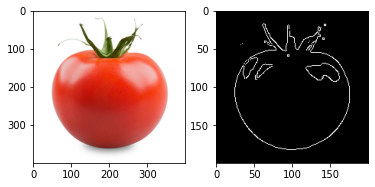

In [27]:
def Canny(img):
    resized = cv2.resize(img, (200, 200))
    resized = cv2.cvtColor(resized, cv2.COLOR_BGR2RGB)

    image, center = clustering_image(resized )
    image = remove_light_color(image, center)
    edge = cv2.Canny(image, 70 ,50)
    return edge
img = cv2.imread ("/content/drive/My Drive/Fruit recognition/valid data /cachua/0115_tomato_istockphoto_oneuseonly.jpg")
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
figure_size = 6
plt.figure(figsize=(figure_size,figure_size))
plt.subplot(1,2,1)
plt.imshow(img)
plt.subplot(1,2,2)
plt.imshow(Canny(img), cmap='gray')
plt.show()

In [28]:
def features_grid(img):
    features = np.array([], dtype='uint8')
    section = 1
    
    for y in range(0, img.shape[0], 40):
        for x in range(0, img.shape[1], 40):
            
            # Cropping the image into a section.
            section_img = img[y:y+40, x:x+40]
            
            # Claculating the mean and stdev of the sectioned image.
            section_mean = np.mean(section_img)
            section_std = np.std(section_img)
            
            # Appending the above calculated values into features array.
            features = np.append(features, [section_mean, section_std])
    
    # Returning the features array.
    return features

In [29]:
def create_df_with_one_image2(img):
  feature_name = []
  section = 1
  for y in range(0, 200, 40):
      for x in range(0, 200, 40):
          feature_name.append(f"sec{section}_mean")
          feature_name.append(f"sec{section}_std")
          section += 1
  
  all_imgs = np.zeros((1, 50), dtype='uint8')

  name = []
  section_mean = []
  section_std = []

  img = Canny(img)

  img_features = features_grid(img)
  img_features = img_features.reshape(1, img_features.shape[0])

  all_imgs = np.append(all_imgs, img_features, axis=0)
  all_imgs = all_imgs[1:]

  df = pd.DataFrame(all_imgs, columns= feature_name)
  return df

## Xét bộ data được chia theo 75/25

In [11]:
train_25 = pd.read_csv('/content/drive/My Drive/Fruit recognition/output_input/25_edge+cluster_train_features.csv')
valid_25 = pd.read_csv ('/content/drive/My Drive/Fruit recognition/output_input/25_edge+cluster_valid_features.csv')

tạo tập label và feature để train và để valid

In [12]:
label_train = train_25['name']
features_train = train_25.drop(['name'], axis = 1)
label_valid = valid_25['name']
features_valid = valid_25.drop(['name'], axis = 1)

In [30]:
models = []
models.append(('rfc', RandomForestClassifier()))
models.append(('svc', SVC()))
models.append(('knn', KNeighborsClassifier()))


for name, model in models:
  print(name)
  model.fit(features_train, label_train)
  pred = model.predict(features_valid)
  print('\ttest', accuracy_score(label_valid, pred))

rfc
	test 0.6984126984126984
svc
	test 0.6984126984126984
knn
	test 0.653968253968254


In [14]:
svc = SVC()
svc.fit (features_train, label_train)

SVC(C=1.0, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='scale', kernel='rbf',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False)

## kiểm tra độ chính xác của model đối với tập test data

tao


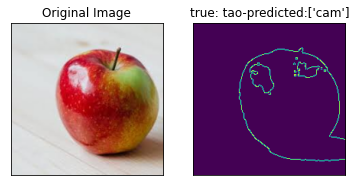

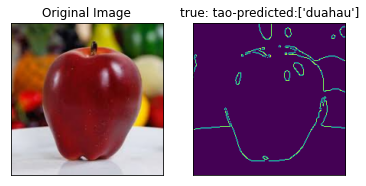

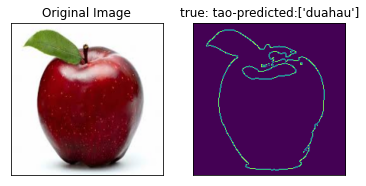

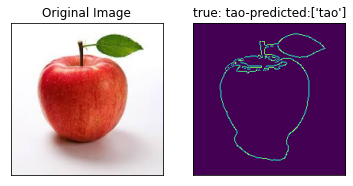

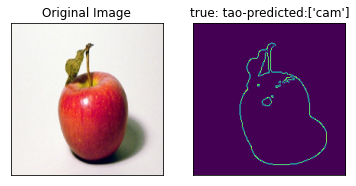

...

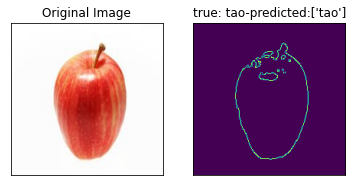

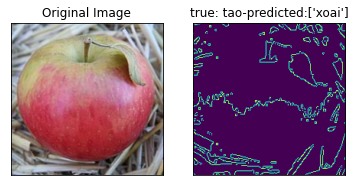

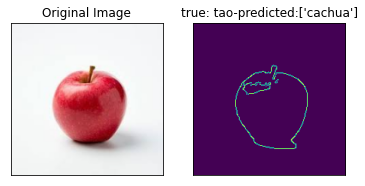

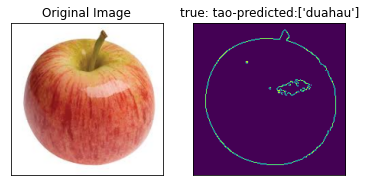

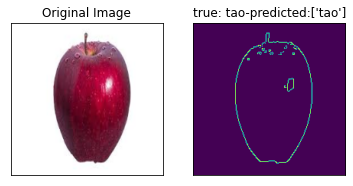

13/16 wrong
nho


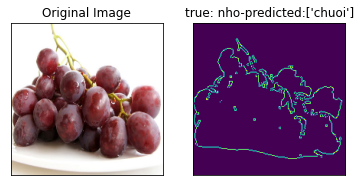

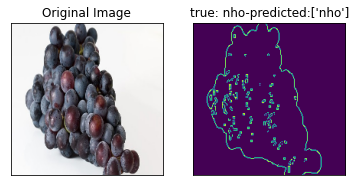

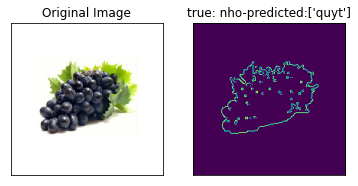

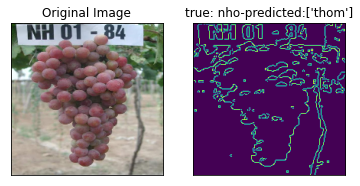

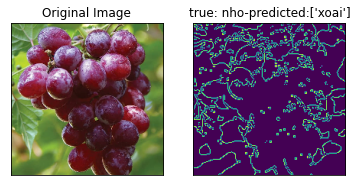

...

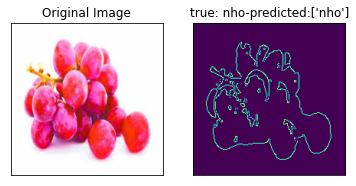

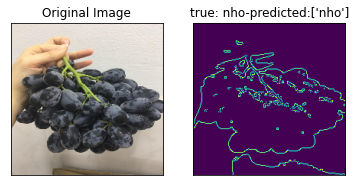

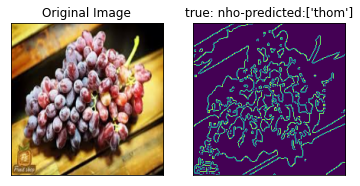

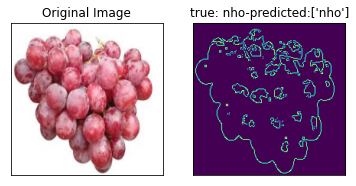

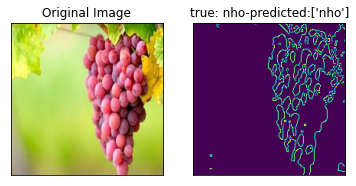

7/12 wrong
quyt


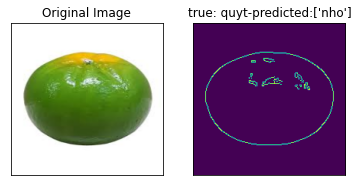

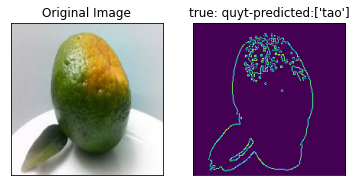

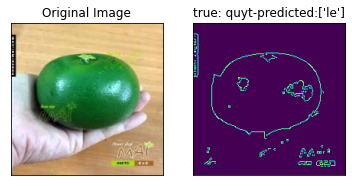

3/3 wrong
xoai


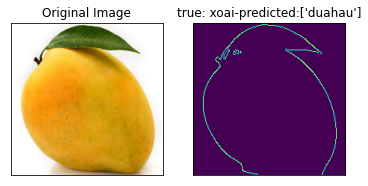

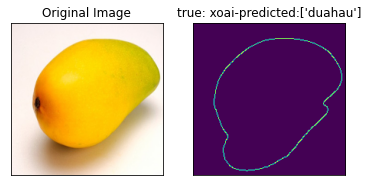

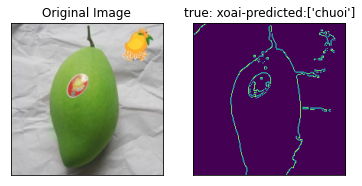

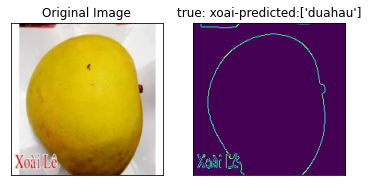

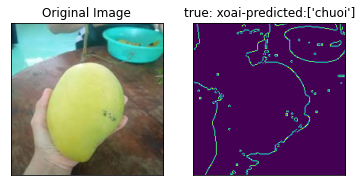

...

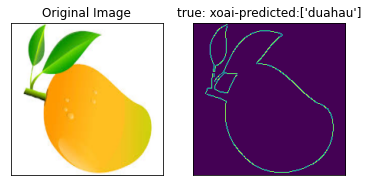

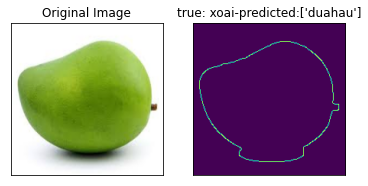

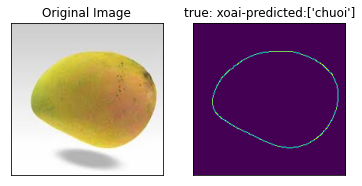

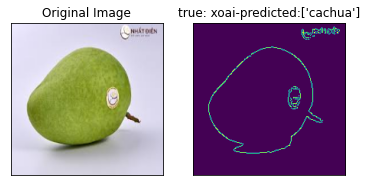

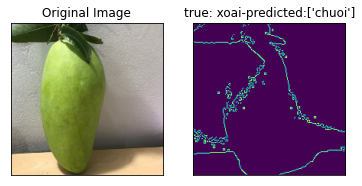

18/19 wrong
thom


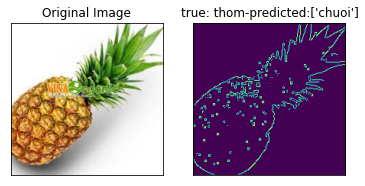

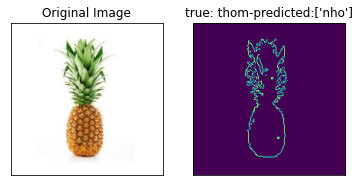

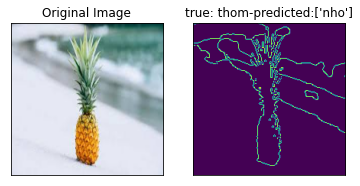

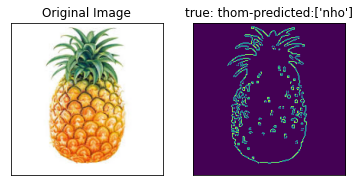

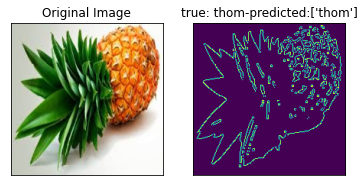

...

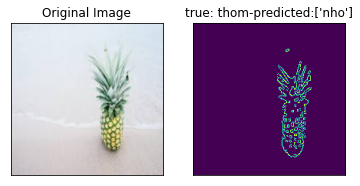

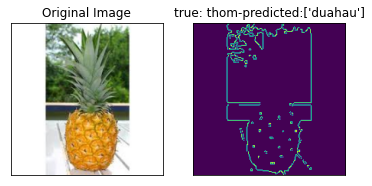

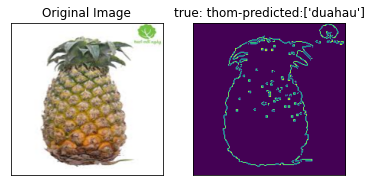

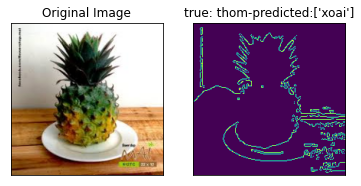

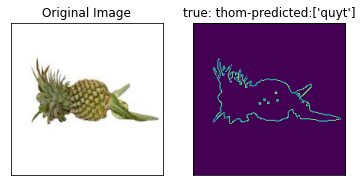

15/19 wrong
cam


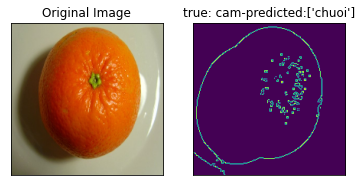

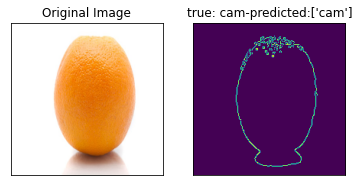

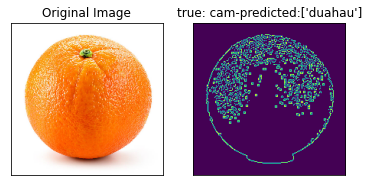

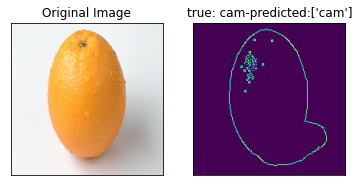

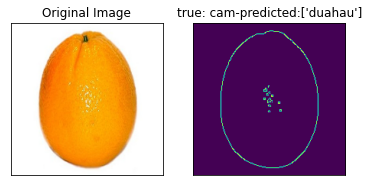

...

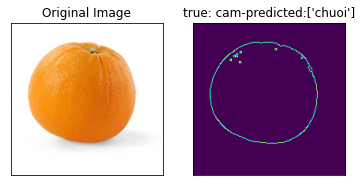

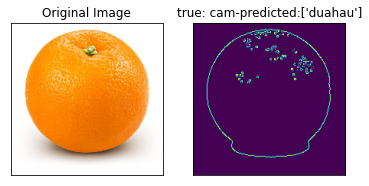

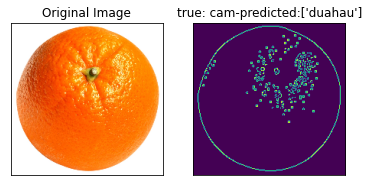

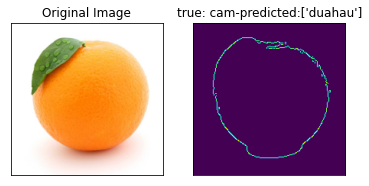

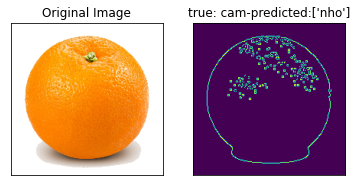

17/19 wrong
chuoi


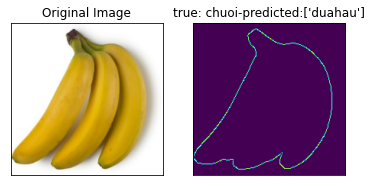

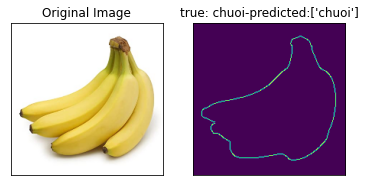

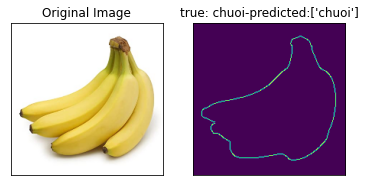

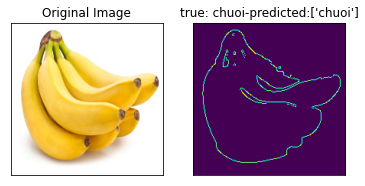

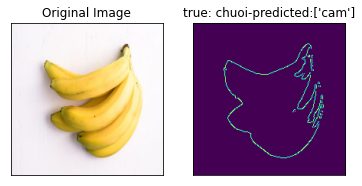

...

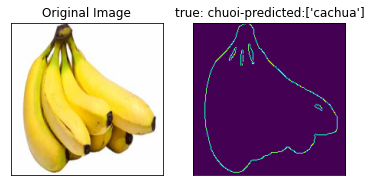

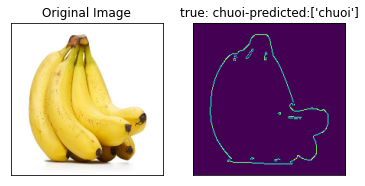

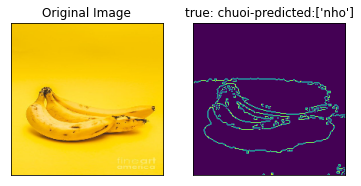

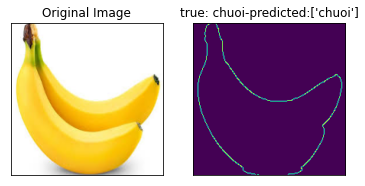

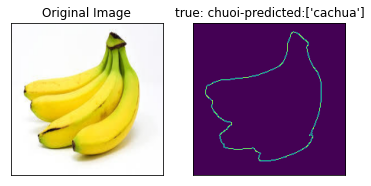

12/22 wrong
le


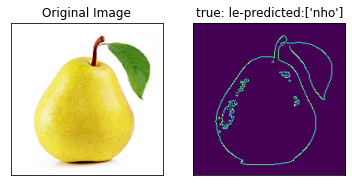

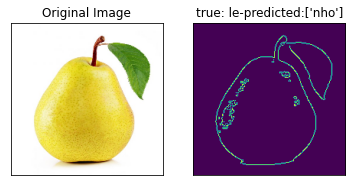

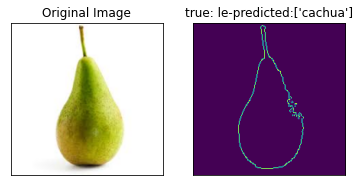

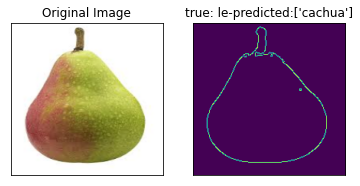

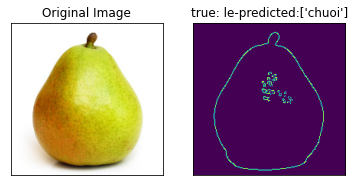

...

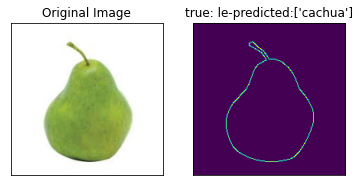

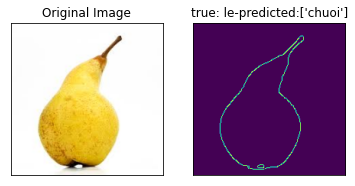

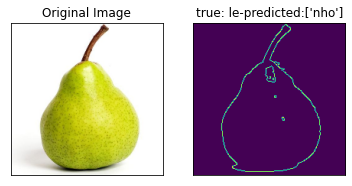

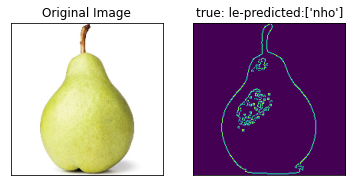

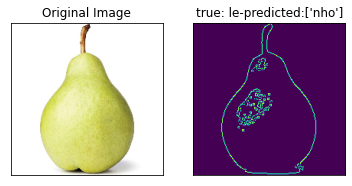

20/20 wrong
duahau


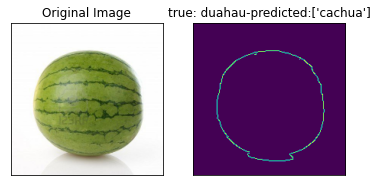

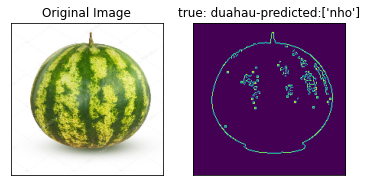

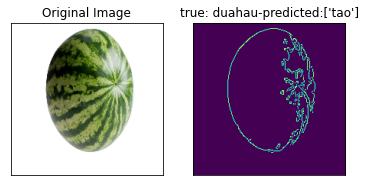

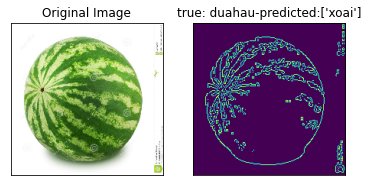

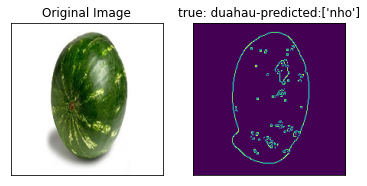

...

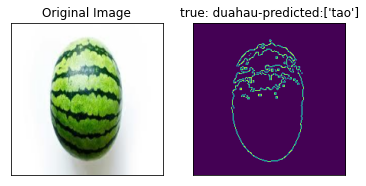

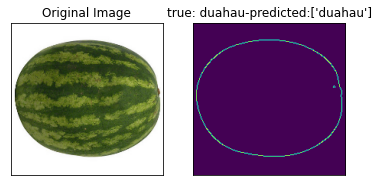

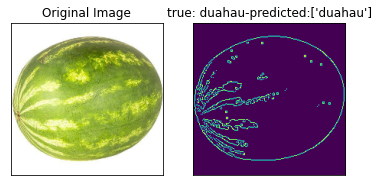

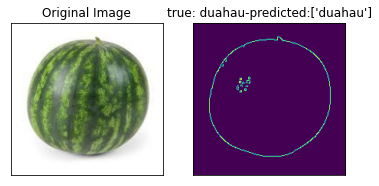

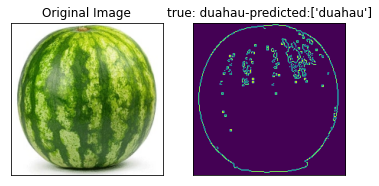

8/19 wrong
cachua


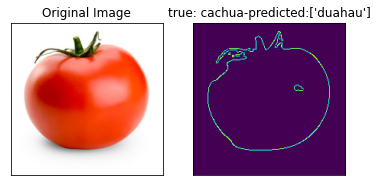

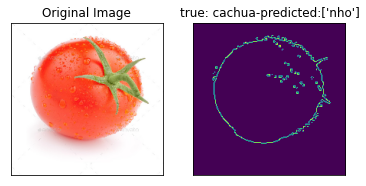

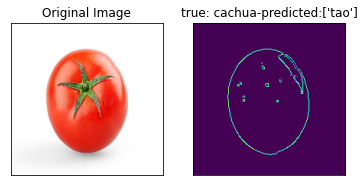

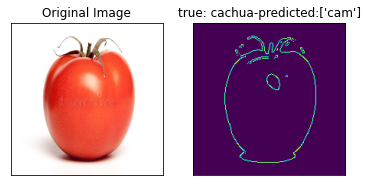

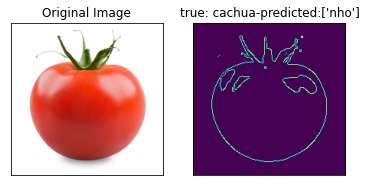

...

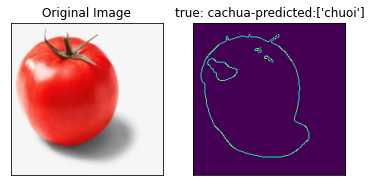

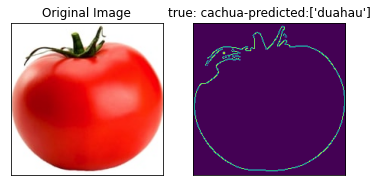

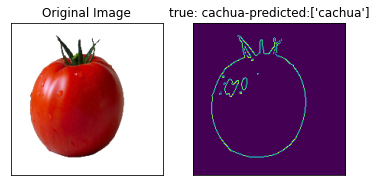

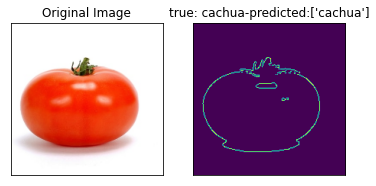

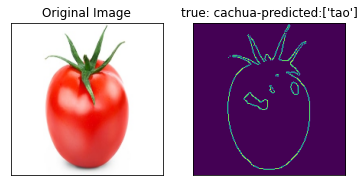

18/20 wrong
131


In [31]:
path = '/content/drive/My Drive/Fruit recognition/valid data '
file_name = os.listdir(path)
all_25 = 0
total_wrong_25 = 0
for name in file_name:
  total = 0
  wrong = 0
  print(name)
  for image in os.listdir(path+'/'+name):
    #print(path+'/'+name+'/'+image)
    img = cv2.imread(path+'/'+name+'/'+image)
    resized_img = cv2.resize(img, (200, 200))
    resized_img = cv2.cvtColor(resized_img,cv2.COLOR_BGR2RGB)

    final_df = create_df_with_one_image2(resized_img)

    predicted_label = svc.predict(final_df)
    if predicted_label != name:
      wrong+=1
    total+=1

    figure_size = 6
    plt.figure(figsize=(figure_size,figure_size))

    plt.subplot(1,2,1)
    plt.imshow(resized_img)
    plt.title('Original Image'), plt.xticks([]), plt.yticks([])

    plt.subplot(1,2,2)
    plt.imshow(Canny(resized_img))
    plt.title('true: {}-predicted:{}'.format(name, predicted_label)), plt.xticks([]), plt.yticks([])

    plt.show()
  print('{}/{} wrong'.format(wrong, total))
  total_wrong_25 += wrong
  all_25 += total
print (total_wrong_25)

## Xét bộ data được chia theo 80/20

In [ ]:
train_20 = pd.read_csv('/content/drive/My Drive/Fruit recognition/output_input/20_edge+cluster_train_features.csv')
valid_20 = pd.read_csv('/content/drive/My Drive/Fruit recognition/output_input/20_edge+cluster_valid_features.csv')

In [ ]:
label_train = train_20['name']
features_train = train_20.drop(['name'], axis = 1)
label_valid = valid_20['name']
features_valid = valid_20.drop(['name'], axis = 1)

In [ ]:
models = []
models.append(('rfc', RandomForestClassifier()))
models.append(('svc', SVC()))
models.append(('knn', KNeighborsClassifier()))


for name, model in models:
  print(name)
  model.fit(features_train, label_train)
  pred = model.predict(features_valid)
  print('\ttest', accuracy_score(label_valid, pred))

rfc
	test 0.686
svc
	test 0.71
knn
	test 0.638


In [ ]:
svc_20 = SVC()
svc_20.fit (features_train, label_train)
pred = svc_20.predict(features_valid)
print('\ttest', accuracy_score(label_valid, pred))

	test 0.71


tao


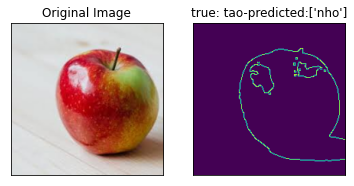

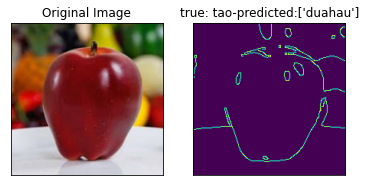

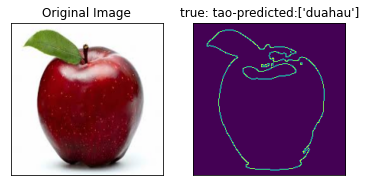

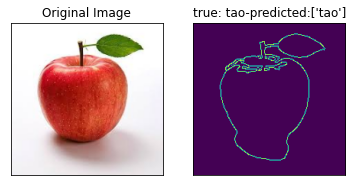

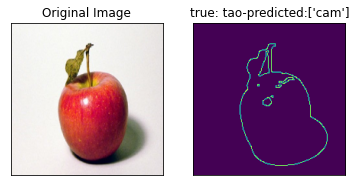

...

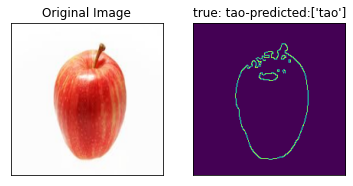

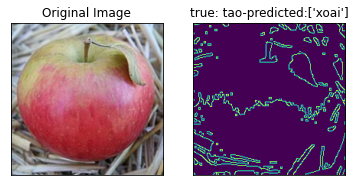

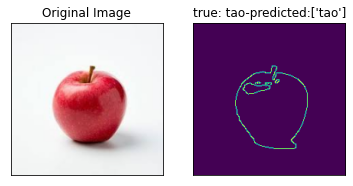

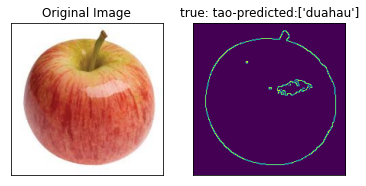

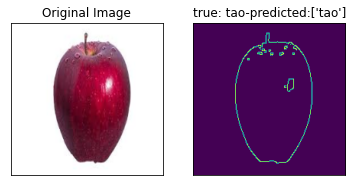

12/16 wrong
nho


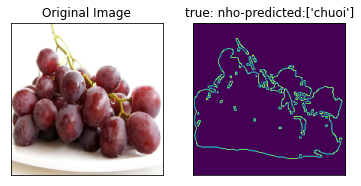

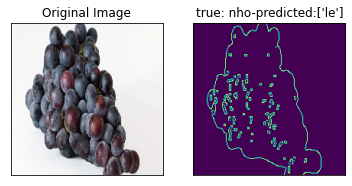

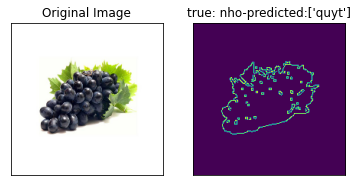

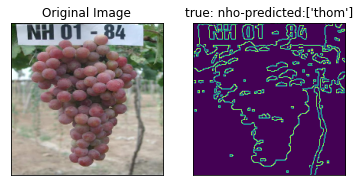

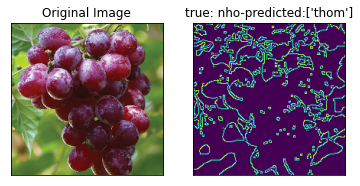

...

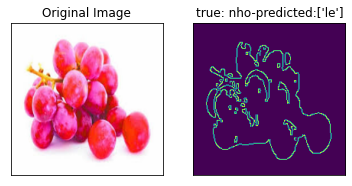

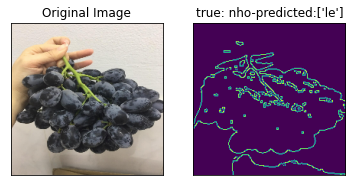

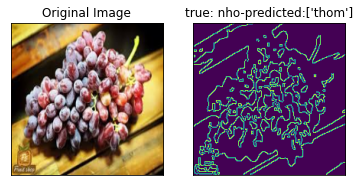

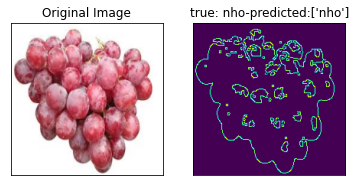

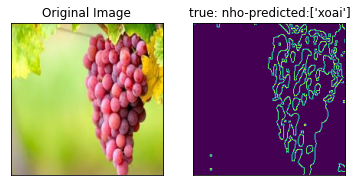

11/12 wrong
quyt


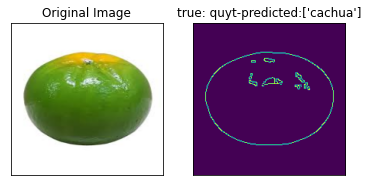

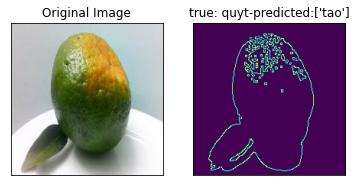

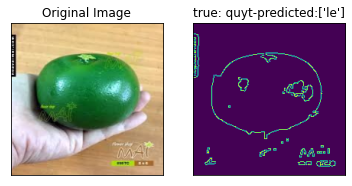

3/3 wrong
xoai


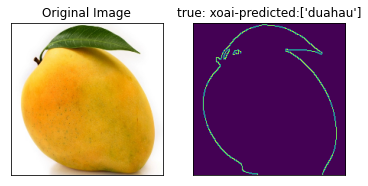

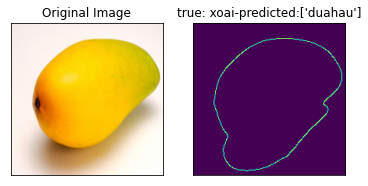

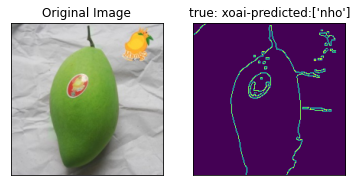

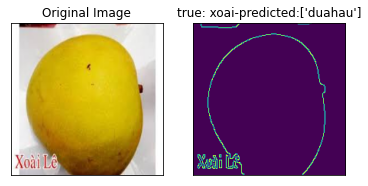

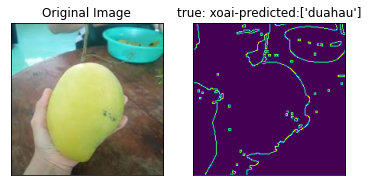

...

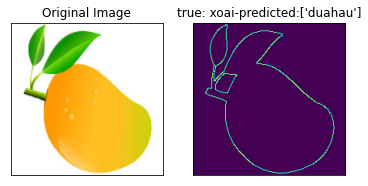

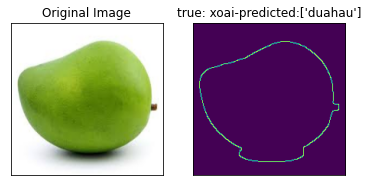

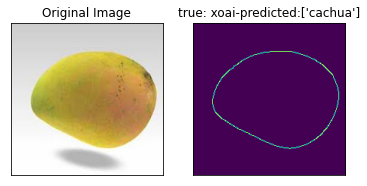

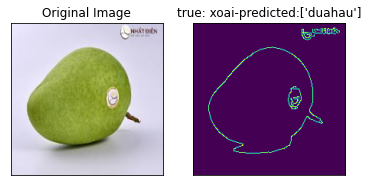

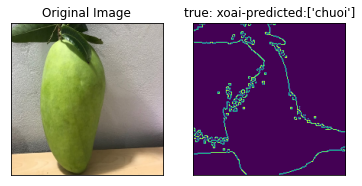

18/19 wrong
thom


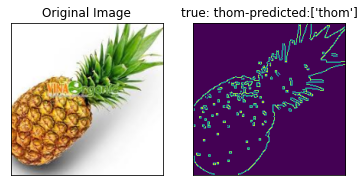

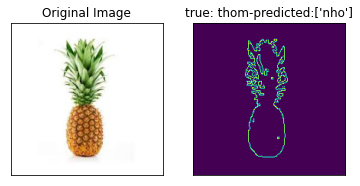

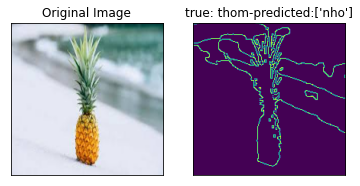

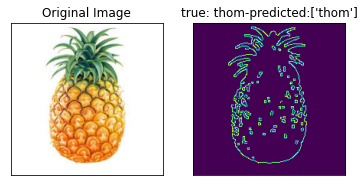

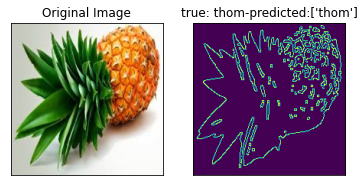

...

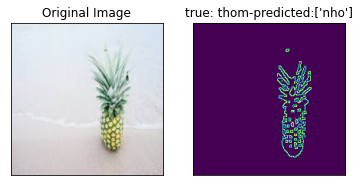

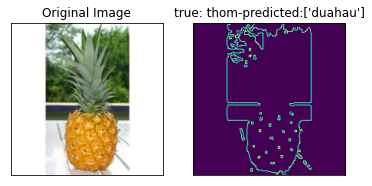

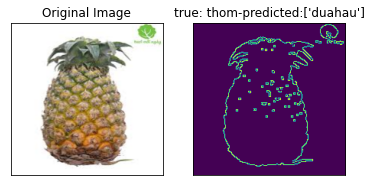

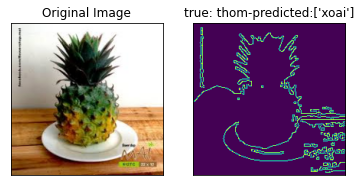

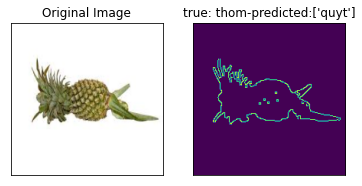

12/19 wrong
cam


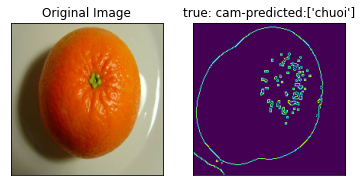

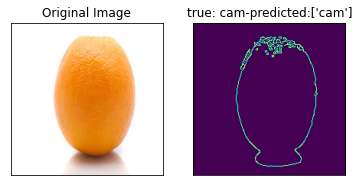

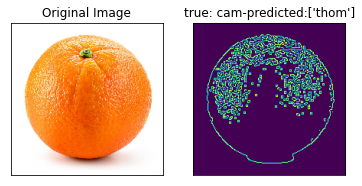

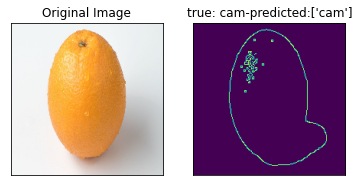

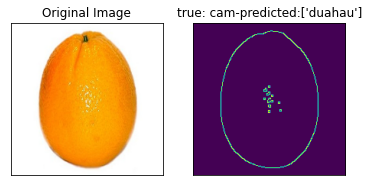

...

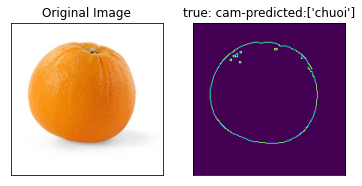

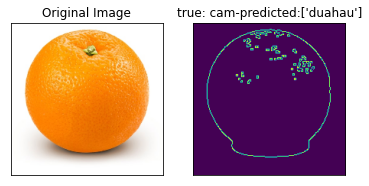

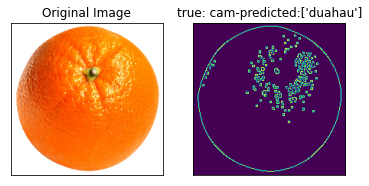

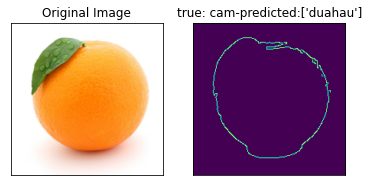

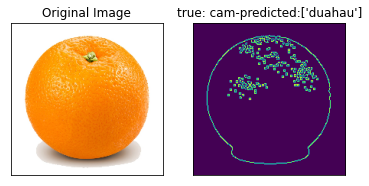

17/19 wrong
chuoi


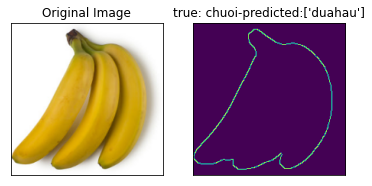

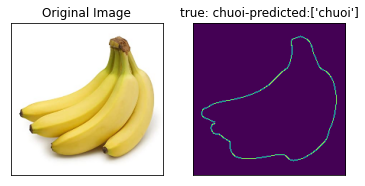

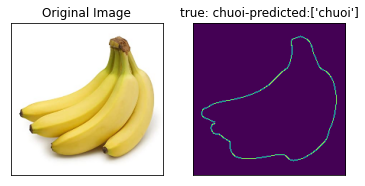

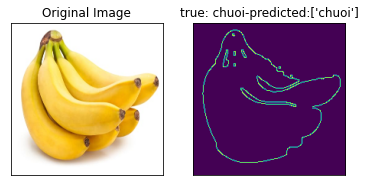

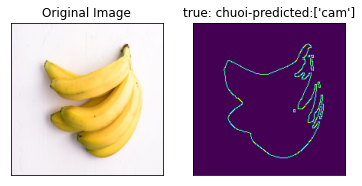

...

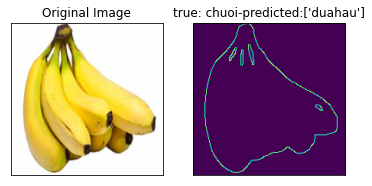

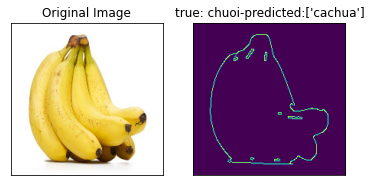

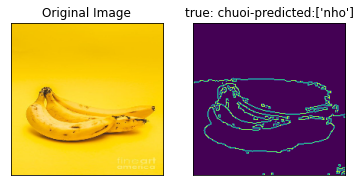

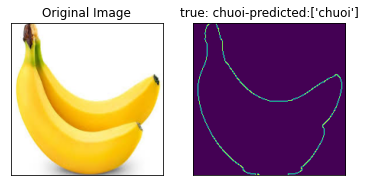

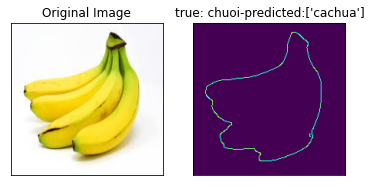

15/22 wrong
le


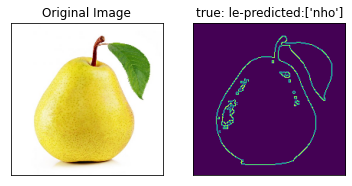

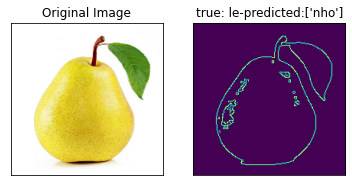

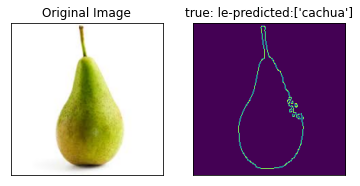

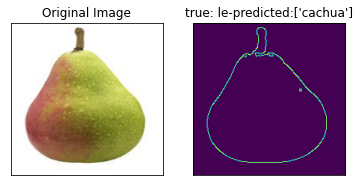

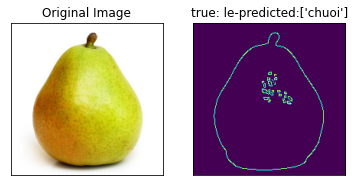

...

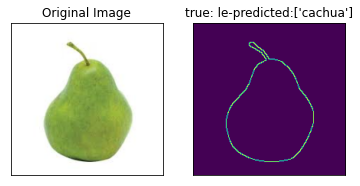

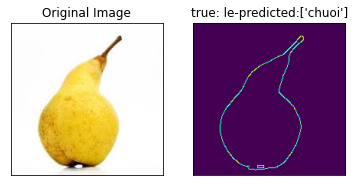

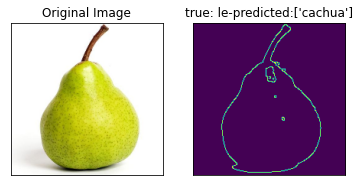

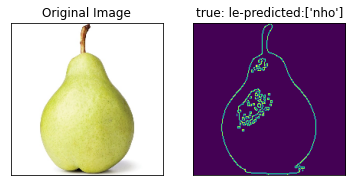

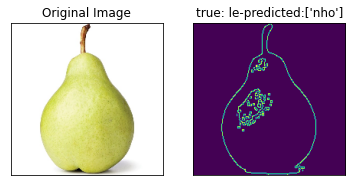

20/20 wrong
duahau


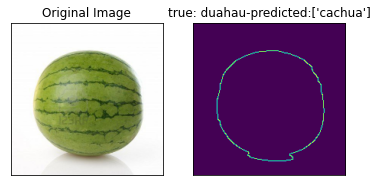

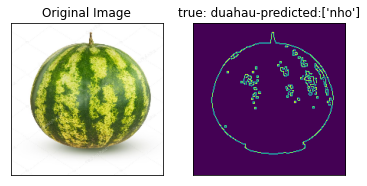

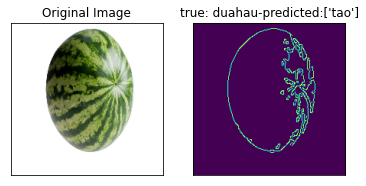

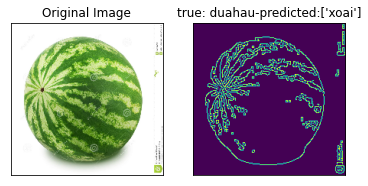

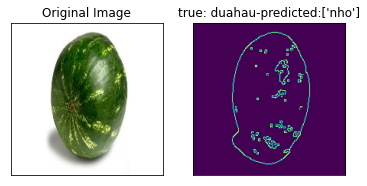

...

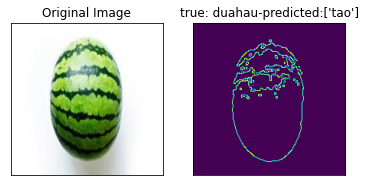

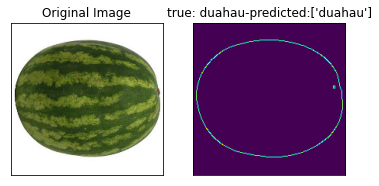

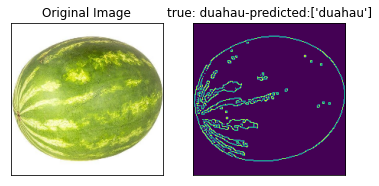

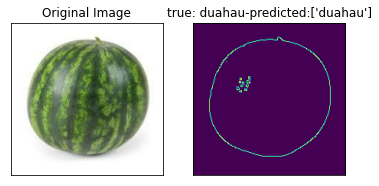

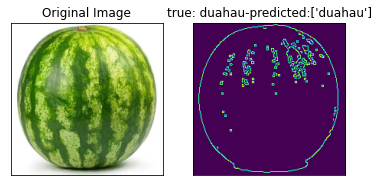

8/19 wrong
cachua


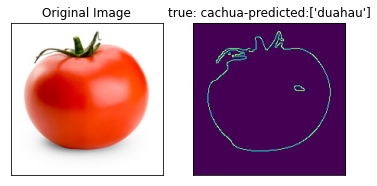

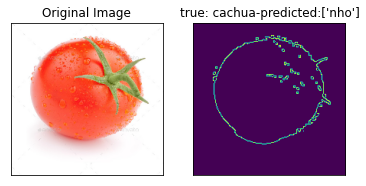

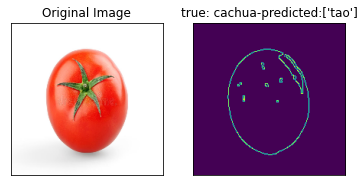

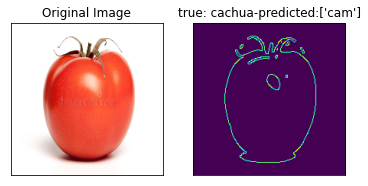

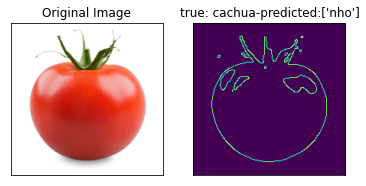

...

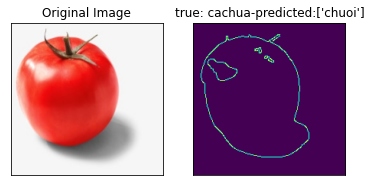

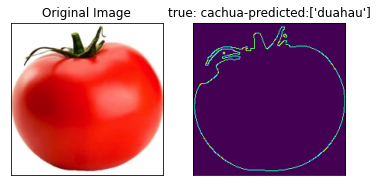

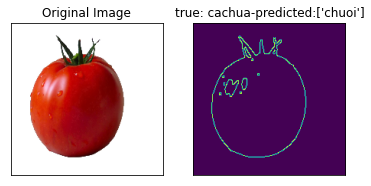

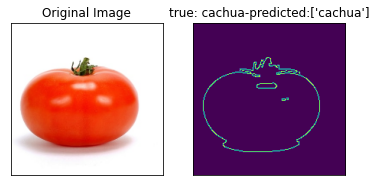

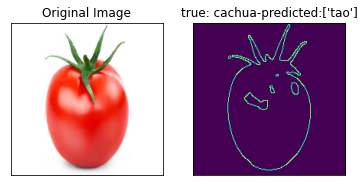

19/20 wrong


NameError: ignored

In [ ]:
path = '/content/drive/My Drive/Fruit recognition/valid data '
file_name = os.listdir(path)
total_wrong = 0
all = 0
for name in file_name:
  total = 0
  wrong = 0
  print(name)
  for image in os.listdir(path+'/'+name):
    #print(path+'/'+name+'/'+image)
    img = cv2.imread(path+'/'+name+'/'+image)
    resized_img = cv2.resize(img, (200, 200))
    resized_img = cv2.cvtColor(resized_img,cv2.COLOR_BGR2RGB)

    final_df = create_df_with_one_image2(resized_img)

    predicted_label = svc_20.predict(final_df)
    if predicted_label != name:
      wrong+=1
    total+=1

    figure_size = 6
    plt.figure(figsize=(figure_size,figure_size))

    plt.subplot(1,2,1)
    plt.imshow(resized_img)
    plt.title('Original Image'), plt.xticks([]), plt.yticks([])

    plt.subplot(1,2,2)
    plt.imshow(Canny(resized_img))
    plt.title('true: {}-predicted:{}'.format(name, predicted_label)), plt.xticks([]), plt.yticks([])

    plt.show()
  print('{}/{} wrong'.format(wrong, total))
  total_wrong += wrong
  all+=total

In [ ]:
print (total_wrong)

135
